## Library loading

In [1]:
import scanpy as sc, anndata as ad, numpy as np, pandas as pd
from scipy import sparse
from anndata import AnnData
import warnings
import socket
import plotly.express as px
from matplotlib import pylab
import sys
import yaml
import os
import matplotlib.pyplot as plt
import scvelo as scv
from pybiomart import Server
import rpy2
from pandas.api.types import CategoricalDtype
import rpy2.robjects as ro
import seaborn as sns
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
from matplotlib_venn import venn3, venn3_circles
from matplotlib import pyplot as plt
import plotly.graph_objects as go
import ipyparams


warnings.filterwarnings('ignore')

<IPython.core.display.Javascript object>

In [2]:
outdir="./outdir"
FinaLeaf = "/Progenitors"
output_basename = "09B_Progenitors_pBulk_bySegment.DEA"
mappingDict = {}
categoriesOrder = ["piece1","piece2","piece3","distal","medial","proximal"]

groupingCovariate = "group"
PseudooReplicates_per_group = 10

markers = "./data/resources/F_T.markers.scored.tsv"


totalPath = outdir+FinaLeaf+"/5B_Progenitors_pBulk.bySegment."+str(PseudooReplicates_per_group)+"PRs.tsv"
adataPath = outdir+FinaLeaf+"/5B_Progenitors_pBulk.bySegment."+str(PseudooReplicates_per_group)+"PRs.h5ad"

badhuriMarkers = ["PAX6","DDIT3","NEUROG2","CNBP","HMGB2","ZNF707","CAMTA1","SUB1","THYN1","NEUROG1","HMGB3","NFIX","BCL11A","TCF4","NR2F1"]

In [3]:
%load_ext rpy2.ipython

In [4]:
%%R
library(edgeR)
library(org.Hs.eg.db)
library(AnnotationDbi)
library(stats)
library(topGO)

R[write to console]: Loading required package: limma

R[write to console]: Loading required package: AnnotationDbi

R[write to console]: Loading required package: stats4

R[write to console]: Loading required package: BiocGenerics

R[write to console]: Loading required package: parallel

R[write to console]: 
Attaching package: ‘BiocGenerics’


R[write to console]: The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


R[write to console]: The following object is masked from ‘package:limma’:

    plotMA


R[write to console]: The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


R[write to console]: The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, 

In [5]:
%matplotlib inline

In [6]:
sc.settings.verbosity = 3         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=50, facecolor='white')
pylab.rcParams['figure.figsize'] = (10, 10)


scanpy==1.8.1 anndata==0.7.6 umap==0.4.6 numpy==1.20.2 scipy==1.6.3 pandas==1.2.4 scikit-learn==0.24.2 statsmodels==0.13.1 python-igraph==0.9.8 louvain==0.7.1 pynndescent==0.5.5


### Configure paths

In [7]:
hostRoot = "-".join(socket.gethostname().split('-')[0:2])

with open(os.path.expanduser('~')+"/paths_config.yaml", 'r') as f:
    paths = yaml.load(f, Loader=yaml.FullLoader)

#indir=paths["paths"]["indir"][hostRoot]
#projectBaseDir=paths["paths"]["projectBaseDir"][hostRoot]


## Load ExcM neurons pseudobulk and set categories order

In [8]:
adata = sc.read_h5ad(adataPath)
adata.obs[groupingCovariate] = adata.obs[groupingCovariate].astype(CategoricalDtype(categories=categoriesOrder, ordered=True))

In [9]:
total = pd.read_csv(totalPath, sep="\t", index_col=0)

## Reorder counts cols

In [10]:
#adata = adata[adata.obs["group"].isin(RelevantAreas)]
total = total[adata.obs_names]

## DEA

### RPY INITIALIZATION

In [11]:
edgeR_topTags = ro.r['topTags']
edgeR_glmLRT = ro.r['glmLRT']
edgeR_glmQLFTest = ro.r['glmQLFTest']
as_data_frame = ro.r['as.data.frame']
rprint = rpy2.robjects.globalenv.find("print")

In [12]:
DEGs = {}
TestCov = groupingCovariate

In [13]:
adata.obs.group.value_counts()

piece1      10
piece2      10
piece3      10
distal      10
medial      10
proximal    10
Name: group, dtype: int64

### MM

In [14]:
obs = adata.obs[[TestCov,"pseudoreplicate"]].copy()
obs["pseudoreplicate"] = obs.index.tolist()
obs["TestCov"] = obs[TestCov].astype(str)

#obs["TestCov"] = obs[TestCov]

### Counts

In [15]:
totalRelevant = total[obs.index]
totalRelevant.head()

,distal_0,distal_1,distal_2,distal_3,distal_4,distal_5,distal_6,distal_7,distal_8,distal_9,...,proximal_0,proximal_1,proximal_2,proximal_3,proximal_4,proximal_5,proximal_6,proximal_7,proximal_8,proximal_9
MIR1302-2HG,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,1.006109,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
FAM138A,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
OR4F5,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
AL627309.1,0.0,0.958561,0.0,0.673234,0.0,0.0,0.0,0.0,0.0,0.0,...,3.919002,1.317389,0.830392,1.786431,0.0,1.688701,2.579079,6.112021,2.980404,2.187134
AL627309.3,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000


In [16]:
minCounts = totalRelevant[totalRelevant > 0].min(axis = 1).min()

#Universe 1 count in at least 5% of samples per group
groupThreshold = round(pd.get_dummies(obs[TestCov]).T.sum(axis = 1) *0.05)
bolMatrix = (np.matrix(np.dot(pd.get_dummies(obs[TestCov]).T, (totalRelevant > 0).astype(int).T)) - np.matrix(groupThreshold).T > 0)
bolVect = (bolMatrix.sum(axis = 0) >= 1).A1
totalRelevant = totalRelevant.loc[bolVect]
len(totalRelevant)

25417

In [17]:
universe = totalRelevant.index.tolist()


In [18]:
levelsToMap = adata.obs[groupingCovariate].cat.categories.tolist()
levelsToMap

['piece1', 'piece2', 'piece3', 'distal', 'medial', 'proximal']

In [19]:
%%R -i obs -i totalRelevant -i levelsToMap -o dds 

mmVector<- factor(obs$TestCov, levels = c(levelsToMap))

mm <- model.matrix(~mmVector )
row.names(mm) <- colnames(totalRelevant)

dds <- DGEList(totalRelevant, group = obs$TestCov, genes = rownames(totalRelevant))

#Ennotate with entrez genes
anno <- select(org.Hs.eg.db, keys=rownames(dds$counts),columns=c("ENTREZID","SYMBOL"),keytype="SYMBOL")
colnames(anno) <- c("genes","entrez")
anno <- anno[!duplicated(anno$genes, fromLast=T), ]
dds$genes$entrez <- merge(x = data.frame(dds$genes), y = anno, by = "genes", all.x = TRUE)$entrez

dim(dds)

R[write to console]: 'select()' returned 1:many mapping between keys and columns



[1] 25417    60


In [20]:
%%R

mm

           (Intercept) mmVectorpiece2 mmVectorpiece3 mmVectordistal
distal_0             1              0              0              1
distal_1             1              0              0              1
distal_2             1              0              0              1
distal_3             1              0              0              1
distal_4             1              0              0              1
distal_5             1              0              0              1
distal_6             1              0              0              1
distal_7             1              0              0              1
distal_8             1              0              0              1
distal_9             1              0              0              1
medial_0             1              0              0              0
medial_1             1              0              0              0
medial_2             1              0              0              0
medial_3             1              0           

In [21]:
%%R -i minCounts

#keep <- filterByExpr(dds, min.count = minCounts, min.total.count = minCounts*5)
#dds <- dds[keep,,keep.lib.sizes=FALSE]
dim(dds)

[1] 25417    60


In [22]:
%%R
dds <- calcNormFactors(dds)
dds <- estimateGLMRobustDisp(dds, mm)
fit <- glmFit(dds, mm)

## MAP contrasts!

In [23]:
levelsToMap

['piece1', 'piece2', 'piece3', 'distal', 'medial', 'proximal']

In [24]:
%%R -o piece2_vs_piece1 -o piece3_vs_piece1  -o distal_vs_piece1  -o medial_vs_piece1  -o proximal_vs_piece1 -o proximal_vs_distal -o medial_vs_distal
#-o Mid_vs_early -o Late_vs_mid
topn=10000

piece2_vs_piece1 = topTags(glmLRT(fit, coef=2), adjust.method = "bonferroni",  n = topn, sort.by = "logFC")
piece3_vs_piece1 = topTags(glmLRT(fit, coef=3), adjust.method = "bonferroni", n = topn, sort.by = "logFC")
distal_vs_piece1 = topTags(glmLRT(fit, coef=4), adjust.method = "bonferroni", n = topn, sort.by = "logFC")
medial_vs_piece1 = topTags(glmLRT(fit, coef=5), adjust.method = "bonferroni",  n = topn, sort.by = "logFC")
proximal_vs_piece1 = topTags(glmLRT(fit, coef=6), adjust.method = "bonferroni",  n = topn, sort.by = "logFC")
proximal_vs_distal = topTags(glmLRT(fit, contrast=c(0,0,0,-1,0,1)), adjust.method = "bonferroni",  n = topn, sort.by = "logFC")
medial_vs_distal = topTags(glmLRT(fit, contrast=c(0,0,0,-1,1,0)), adjust.method = "bonferroni",  n = topn, sort.by = "logFC")

In [25]:
DEGsDict = {"piece2_vs_piece1":piece2_vs_piece1,
            "piece3_vs_piece1":piece3_vs_piece1,
            "distal_vs_piece1":distal_vs_piece1,
            "medial_vs_piece1":medial_vs_piece1,
            "proximal_vs_piece1":proximal_vs_piece1,
            "proximal_vs_distal":proximal_vs_distal,
            "medial_vs_distal":medial_vs_distal,
           }


# Volcanos.

In [26]:
markersDF = pd.read_csv(markers, header=None, sep = "\t", names=["name","area","score"])
temporalMarkers = markersDF.loc[markersDF["area"] == "Temporal","name"]
frontalMarkers = markersDF.loc[markersDF["area"] == "Frontal","name"]

In [27]:



LOGCFTHRESHOLD = 1.5
for k in list(DEGsDict.keys()):
    

    DEGsDict[k] = rpy2.robjects.pandas2ri.rpy2py(as_data_frame(DEGsDict[k]))
    DEGsDict[k]["-logPVal"] = -np.log10(DEGsDict[k].PValue)
    DEGsDict[k]["significant"] = "notSignificant"
    DEGsDict[k].loc[(DEGsDict[k]["logFC"] < -LOGCFTHRESHOLD) &  (DEGsDict[k]["FWER"] < 0.01),"significant"] = "Down"
    DEGsDict[k].loc[(DEGsDict[k]["logFC"] > LOGCFTHRESHOLD) &  (DEGsDict[k]["FWER"] < 0.01),"significant"] = "Up"
    #DEGsDict[k]["knownMarker"] = "unlisted"
    #DEGsDict[k].loc[set(frontalMarkers).intersection(DEGsDict[k].index),"knownMarker"] = "frontal"
    #DEGsDict[k].loc[set(temporalMarkers).intersection(DEGsDict[k].index),"knownMarker"] = "temporal"



    color_discrete_map = {'notSignificant': 'white', 'Up': 'red', 'Down': 'blue'}

    fig = px.scatter(DEGsDict[k], x="logFC", y="-logPVal",
                     #hover_data=DEGsDict[k][["genes","knownMarker"]], 
                     hover_data=DEGsDict[k][["genes"]], 
                     width=600, height=600, 
                     color = "significant", color_discrete_map=color_discrete_map,
                     #symbol="knownMarker",
                     title=k,
                    template="simple_white")
    
    
    fig.update_traces(mode='markers', marker_line_width=1, marker_size=10)
    
    fig.add_hline(y=DEGsDict[k].loc[DEGsDict[k]["FWER"] - 0.01 < 0,"-logPVal" ].min(), 
                  line_color="black",line_width=2, line_dash="dash")

    fig.add_vline(x=LOGCFTHRESHOLD, 
                  line_color="black",line_width=2, line_dash="dash")
        
    fig.add_vline(x=-LOGCFTHRESHOLD, 
                  line_color="black",line_width=2, line_dash="dash")
    fig.show()
    

# GO Contrast

## Pick the contrast for GO and name to save as

In [28]:
contrast = "proximal_vs_distal"
GOname = "GO_proximal_vs_distal.tsv"
GOlist = DEGsDict[contrast][DEGsDict[contrast]["significant"] != "notSignificant"].index.tolist()

In [29]:
%%R -i GOlist -i universe -o results


Universe <- universe
Temporal_vs_PFCVector <- factor(as.integer(Universe%in%GOlist))
names(Temporal_vs_PFCVector) <- Universe

BPann <- inverseList(topGO::annFUN.org(whichOnto="BP", feasibleGenes=names(Temporal_vs_PFCVector),  
                                       mapping="org.Hs.eg.db", ID="symbol"))

    
GOdata <- new('topGOdata', ontology="BP", allGenes=Temporal_vs_PFCVector, annotat=annFUN.gene2GO, 
                         gene2GO=BPann, nodeSize=15)

GOtest <- runTest(GOdata, algorithm='weight01', statistic='fisher')


results <- topGO::GenTable(GOdata, Statistics=GOtest, topNodes=length(GOtest@score), numChar=100)

R[write to console]: 
Building most specific GOs .....

R[write to console]: 	( 11918 GO terms found. )

R[write to console]: 
Build GO DAG topology ..........

R[write to console]: 	( 15738 GO terms and 36637 relations. )

R[write to console]: 
Annotating nodes ...............

R[write to console]: 	( 14770 genes annotated to the GO terms. )

R[write to console]: 
			 -- Weight01 Algorithm -- 

		 the algorithm is scoring 3560 nontrivial nodes
		 parameters: 
			 test statistic: fisher

R[write to console]: 
	 Level 19:	1 nodes to be scored	(0 eliminated genes)

R[write to console]: 
	 Level 18:	1 nodes to be scored	(0 eliminated genes)

R[write to console]: 
	 Level 17:	5 nodes to be scored	(20 eliminated genes)

R[write to console]: 
	 Level 16:	10 nodes to be scored	(27 eliminated genes)

R[write to console]: 
	 Level 15:	21 nodes to be scored	(103 eliminated genes)

R[write to console]: 
	 Level 14:	38 nodes to be scored	(241 eliminated genes)

R[write to console]: 
	 Level 13:	71

In [30]:
FilteredResults = results[results["Statistics"].astype(float) < 0.01]
FilteredResults.to_csv(outdir+FinaLeaf+"/"+output_basename+"."+GOname, sep = "\t")
FilteredResults.Term.tolist()[:20]

['forebrain regionalization',
 'cerebral cortex development',
 'negative regulation of ERK1 and ERK2 cascade',
 'neuron migration',
 'innervation',
 'forebrain neuron development',
 'positive regulation of neuron differentiation',
 'negative regulation of transcription by RNA polymerase II',
 'axon guidance',
 'pulmonary valve morphogenesis',
 'negative regulation of neuron differentiation',
 'positive regulation of myoblast differentiation',
 'anterior/posterior pattern specification',
 'negative regulation of fibroblast growth factor receptor signaling pathway',
 'hippocampus development',
 'negative regulation of smooth muscle cell migration',
 'cell fate determination',
 'endothelial cell differentiation',
 'regulation of cell growth',
 'heterophilic cell-cell adhesion via plasma membrane cell adhesion molecules']

## Double check for results

In [31]:
UP = DEGsDict[contrast][DEGsDict[contrast]["significant"] != "notSignificant"].sort_values("logFC", ascending = False)
UP = UP[UP.logFC > 0].index.tolist()

In [32]:
DOWN = DEGsDict[contrast][DEGsDict[contrast]["significant"] != "notSignificant"].sort_values("logFC", ascending = True)
DOWN = DOWN[DOWN.logFC < 0].index.tolist()

Upregulated in contrast proximal_vs_distal


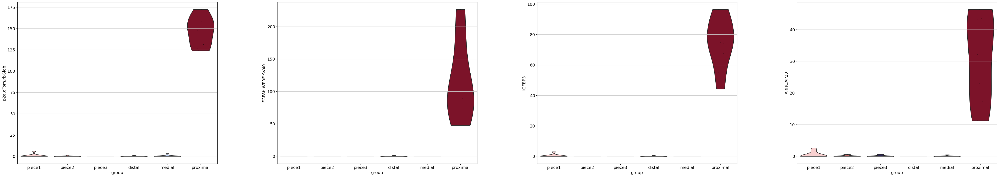

In [33]:
print("Upregulated in contrast "+contrast)

sc.pl.violin(adata, 
             keys = UP[:4] , 
             groupby=groupingCovariate)

Downregolated in contrast proximal_vs_distal


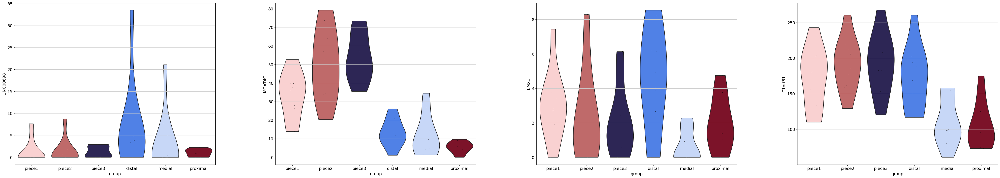

In [34]:
print("Downregolated in contrast "+contrast)
sc.pl.violin(adata, 
             keys = DOWN[:4] , 
             groupby=groupingCovariate)

# Save

In [35]:
for k in DEGsDict.keys():
    DEGsDict[k][DEGsDict[k].significant != "notSignificant" ].sort_values("logFC", ascending = False).to_csv(outdir+FinaLeaf+"/"+output_basename+"."+ k + ".tsv", sep = "\t")
    DEGsDict[k][DEGsDict[k].significant != "notSignificant" ].sort_values("logFC", ascending = False).to_excel(outdir+FinaLeaf+"/"+output_basename+"."+ k + ".xls")

# Overlap Contrast DEGS ~ temporal_vs_PFC Known markers

In [36]:
PolaroidDEGs = DEGsDict[contrast][DEGsDict[contrast]["significant"] != "notSignificant"]
PolaroidDEGs

,genes,entrez,logFC,logCPM,LR,PValue,FWER,-logPVal,significant
p2a.dTom.rbGlob,p2a.dTom.rbGlob,7791,8.075772,6.243359,349.935460,4.377177e-78,1.112547e-73,77.358806,Up
FGF8b.WPRE.SV40,FGF8b.WPRE.SV40,23140,7.622885,5.750889,131.252489,2.180331e-30,5.541747e-26,29.661478,Up
IGFBP3,IGFBP3,28991,7.169743,5.455421,160.860285,7.339888e-37,1.865579e-32,36.134311,Up
ARHGAP20,ARHGAP20,8844,6.344344,4.569972,63.409939,1.678689e-15,4.266724e-11,14.775030,Up
RYR3,RYR3,5125,6.318444,5.762549,200.705325,1.465263e-45,3.724259e-41,44.834084,Up
...,...,...,...,...,...,...,...,...,...
JAG1,JAG1,9144,1.519297,6.412512,65.609705,5.496742e-16,1.397107e-11,15.259895,Up
MAML2,MAML2,3820,1.519032,7.956134,110.947593,6.075576e-26,1.544229e-21,25.216413,Up
LRIG1,LRIG1,None,1.517736,7.237127,65.612434,5.489134e-16,1.395173e-11,15.260496,Up
SPRED1,SPRED1,5144,1.502520,8.081083,164.585230,1.126980e-37,2.864445e-33,36.948084,Up


In [37]:
CuratedList = pd.read_csv(markers, header=None, sep = "\t", names=["name","area","score"])
CuratedList.index = CuratedList["name"]
CuratedList

,name,area,score
name,,,
NR2F1,NR2F1,Temporal,3.0
FLJ42709,FLJ42709,Temporal,1.0
CDS1,CDS1,Temporal,1.0
OPRL1,OPRL1,Temporal,1.0
SLC27A2,SLC27A2,Temporal,1.0
...,...,...,...
FAHD1,FAHD1,Frontal,1.0
CDH8,CDH8,Frontal,1.0
SATB2,SATB2,Frontal,2.0


proximal_vs_distal
Frontal AND ContrastUP {'ABCA1', 'CDH6', 'TNIK', 'TENM1', 'S100A13', 'FAM184A', 'PTX3', 'ETV1', 'PRSS23', 'GREB1'}
Temporal AND ContrastUP {'NEFL'}


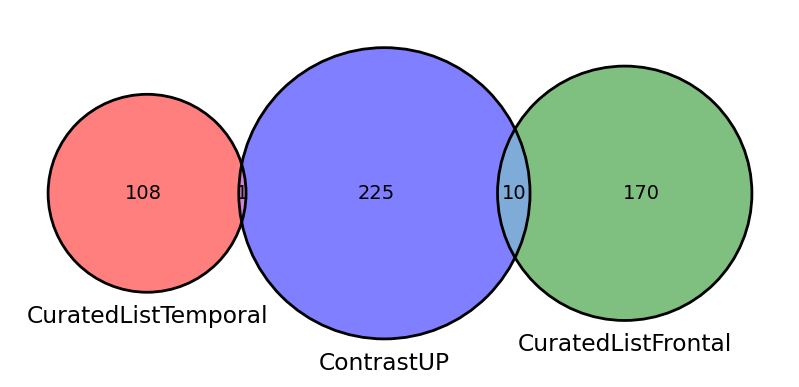

In [38]:
CuratedListTemporal = set(CuratedList.loc[CuratedList.area == "Temporal","name"])
CuratedListFrontal = set(CuratedList.loc[CuratedList.area == "Frontal","name"])
ContrastUP = set(UP)

A = len(CuratedListTemporal.difference(CuratedListFrontal).difference(ContrastUP))
B = len(CuratedListFrontal.difference(ContrastUP).difference(CuratedListTemporal))
C = len(CuratedListTemporal.intersection(CuratedListFrontal).difference(ContrastUP))
D = len(ContrastUP.difference(CuratedListFrontal).difference(CuratedListTemporal))
E = len(ContrastUP.intersection(CuratedListTemporal).difference(CuratedListFrontal))
F = len(ContrastUP.intersection(CuratedListFrontal).difference(CuratedListTemporal))
G = len(ContrastUP.intersection(CuratedListFrontal).intersection(CuratedListTemporal))


venn3(subsets = (A, B, C, D, E, F, G), set_labels = ('CuratedListTemporal', 'CuratedListFrontal', 'ContrastUP'), alpha = 0.5);
venn3_circles(subsets = (A, B, C, D, E, F, G), linewidth=2, color='k');

print(contrast)

print("Frontal AND ContrastUP "+str(CuratedListFrontal.intersection(ContrastUP)))
print("Temporal AND ContrastUP "+str(CuratedListTemporal.intersection(ContrastUP)))

proximal_vs_distal
Frontal AND ContrastDown {'ZIC3', 'NEUROG2'}
Temporal AND ContrastDown {'PAX6', 'RASD1', 'WNT7B', 'EPHA7', 'LHX2', 'EPHA5', 'IFI44L'}


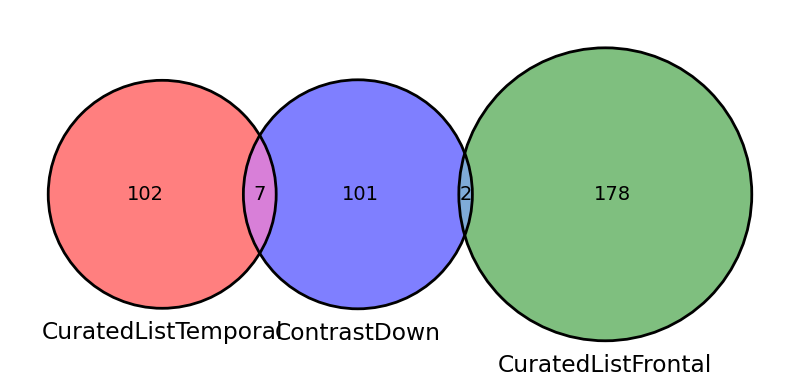

In [39]:
CuratedListTemporal = set(CuratedList.loc[CuratedList.area == "Temporal","name"])
CuratedListFrontal = set(CuratedList.loc[CuratedList.area == "Frontal","name"])
ContrastDown = set(DOWN)

A = len(CuratedListTemporal.difference(CuratedListFrontal).difference(ContrastDown))
B = len(CuratedListFrontal.difference(ContrastDown).difference(CuratedListTemporal))
C = len(CuratedListTemporal.intersection(CuratedListFrontal).difference(ContrastDown))
D = len(ContrastDown.difference(CuratedListFrontal).difference(CuratedListTemporal))
E = len(ContrastDown.intersection(CuratedListTemporal).difference(CuratedListFrontal))
F = len(ContrastDown.intersection(CuratedListFrontal).difference(CuratedListTemporal))
G = len(ContrastDown.intersection(CuratedListFrontal).intersection(CuratedListTemporal))


venn3(subsets = (A, B, C, D, E, F, G), set_labels = ('CuratedListTemporal', 'CuratedListFrontal', 'ContrastDown'), alpha = 0.5);
venn3_circles(subsets = (A, B, C, D, E, F, G), linewidth=2, color='k');

print(contrast)

print("Frontal AND ContrastDown "+str(CuratedListFrontal.intersection(ContrastDown)))
print("Temporal AND ContrastDown "+str(CuratedListTemporal.intersection(ContrastDown)))